In [311]:
import os
import numpy as np
import pandas as pd
import geopandas as gpd
import xarray as xr
import networkx as nx
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

In [90]:
def load_dataset(q, delta=7, omega=28, base_folder="../outputs/TE_cnig_provincias"):
    experiment = f"run_ETE_w{omega}_d{delta}_S_Q1_-{q}_Q2_{q}_risk_ij"
    exp_folder = os.path.join(base_folder, experiment)
    results_fname = os.path.join(exp_folder, "TE.nc")
    return xr.load_dataset(results_fname)

def heatmap_global_TE(data, title="", cmap='bwr'):
    
    fig, ax = plt.subplots(1, 1, figsize=(18,12), sharex=True, dpi=200)
    ax.set_title(title)
    
    g = sns.heatmap(data, cmap=cmap, linewidths=.01, linecolor='grey', cbar_kws={'shrink': 0.6}, ax=ax)
    _ = g.set_yticklabels(g.get_yticklabels(), rotation = 0)
    _ = g.set_xticklabels(g.get_xticklabels(), rotation = 75)
    
    fig.tight_layout()
    return fig

In [313]:
base_folder = "../outputs/TE_cnig_provincias/"
cases_fname = os.path.join(base_folder, "cases_pop_ds.nc")
risk_ij_fname = os.path.join(base_folder, "risk_ds.nc")

cases_ds = xr.load_dataset(cases_fname)
risk_ds = xr.load_dataset(risk_ij_fname)

risk_ij_da = risk_ds['risk_ij']
trips_ij_da = risk_ds['trips_ij']

dt_risk_ij_da = risk_ij.diff('date')
dt_trips_ij_da = trips_ij.diff('date')

cases_by_100k_da = cases_ds['new_cases_by_100k']
dt_cases_by_100k_da = cases_by_100k.diff('date')

dates = risk_ij_dt.coords['date'].values

df_pro = pd.read_parquet('../data/cnig_provincias.parquet').sort_index()
df_pro = df_pro.drop(['51', '52'])
pro_names = df_pro['pro_name'].values

X_fname = os.path.join(exp_folder, "X.nc")
X_ij = xr.load_dataarray(X_fname)

Y_fname = os.path.join(exp_folder, "Y.nc")
Y_j = xr.load_dataarray(Y_fname)

TE_dates = TE_ds.coords['date'].values[130:]

In [418]:
var = "ETE_dynamic"
da = TE_ds[var].max('date')
da.argmax(...)
#da.loc['49', '47']

{'source': <xarray.DataArray 'ETE_dynamic' ()>
 array(48),
 'target': <xarray.DataArray 'ETE_dynamic' ()>
 array(46)}

In [434]:
omega = 28
delta = 7

i = '49'
j = '47'

i = '18'
j = '04'

i = '07'
j = '08'

i_name = df_pro.loc[i, 'pro_name']
j_name = df_pro.loc[j, 'pro_name']

var = "TE_dynamic"
argmax_idx = int(TE_ds[var].loc[i, j, TE_dates].argmax('date'))  

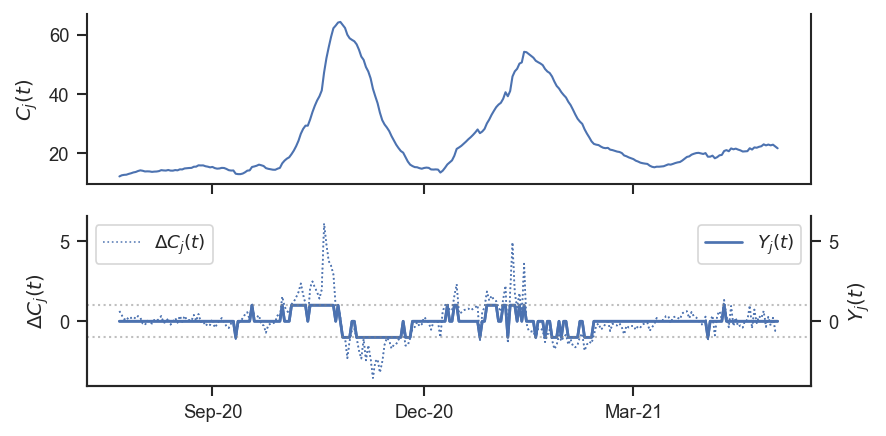

In [432]:
lw = 1.5
lw_dt = 0.8
fig, axes = plt.subplots(2, 1, figsize=(6, 3), sharex=True, dpi=150)

ax = axes[0]
ax.plot(cases_by_100k_da.loc[j, TE_dates].to_pandas(), label=rf"C[{j}](t)", c='b', lw=1)
ax.set_ylabel(r"$C_{j}(t)$")

ax = axes[1]
ax.plot(dt_cases_by_100k_da.loc[j, TE_dates].to_pandas(), c='b', lw=lw_dt, alpha=0.9, linestyle='dotted', label=r"$\Delta C_{j}(t)$")
ax.plot(Y_j.loc[j, TE_dates].to_pandas()-1, lw=1.3, c='b')
ax.set_ylabel(r"$\Delta C_{j}(t)$")
ax.legend(loc=2)
ax = ax.twinx()
ax.plot(dt_cases_by_100k_da.loc[j, TE_dates].to_pandas(), c='b', lw=lw_dt, alpha=0.9, linestyle='dotted')
ax.plot(Y_j.loc[j, TE_dates].to_pandas()-1, lw=1.3, c='b', label=r"$Y_j(t)$")
ax.set_ylabel(r"$Y_j(t)$")
ax.legend(loc=1)

ax.axhline(y = 1, color = 'grey', lw=1, linestyle = 'dotted', alpha=0.5) 
ax.axhline(y = -1, color = 'grey', lw=1, linestyle = 'dotted', alpha=0.5) 

ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3)) 
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b-%y')) 
sns.despine(right=False)
fig.tight_layout()

fig_folder = "../outputs/TE_cnig_provincias/figures"
fig_name = os.path.join(fig_folder, f"Cases_Y_j_{j_name}_q_{float(q):.2f}_delta_{delta}.png")
fig.savefig(fig_name)

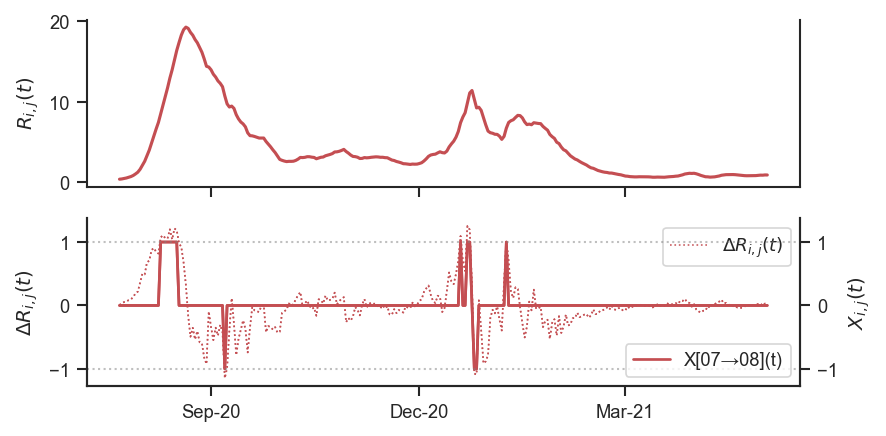

In [435]:
lw = 1.5
lw_dt = 0.8
fig, axes = plt.subplots(2, 1, figsize=(6, 3), sharex=True, dpi=150)

ax = axes[0]
ax.plot(risk_ij_da.loc[i, j, TE_dates].to_pandas(), label=rf"$R[{i}→{j}](t)$", lw=lw, c='r')
ax.set_ylabel(r"$R_{i,j}(t)$")

ax = axes[1]
ax.plot(dt_risk_ij_da.loc[i, j, TE_dates].to_pandas(), c='r', lw=lw_dt, alpha=0.9, linestyle='dotted', label=r"$\Delta R_{i,j}(t)$")
ax.plot(X_ij.loc[i, j, TE_dates].to_pandas()-1, lw=1.3, c='r')
ax.set_ylabel(r"$\Delta R_{i,j}(t)$")
ax.legend(loc=1)
ax = ax.twinx()
ax.plot(dt_risk_ij_da.loc[i, j, TE_dates].to_pandas(), c='r', lw=lw_dt, alpha=0.9, linestyle='dotted')
ax.plot(X_ij.loc[i, j, TE_dates].to_pandas()-1, lw=1.3, c='r', label=rf"X[{i}→{j}](t)")
ax.set_ylabel(r"$X_{i,j}(t)$")
ax.legend(loc=4)

ax.axhline(y = 1, color = 'grey', lw=1, linestyle = 'dotted', alpha=0.5) 
ax.axhline(y = -1, color = 'grey', lw=1, linestyle = 'dotted', alpha=0.5) 

ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3)) 
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b-%y')) 
sns.despine(right=False)
fig.tight_layout()

fig_folder = "../outputs/TE_cnig_provincias/figures"
fig_name = os.path.join(fig_folder, f"Risk_X_ij_{i_name}_{j_name}_q_{float(q):.2f}_delta_{delta}.png")
fig.savefig(fig_name)

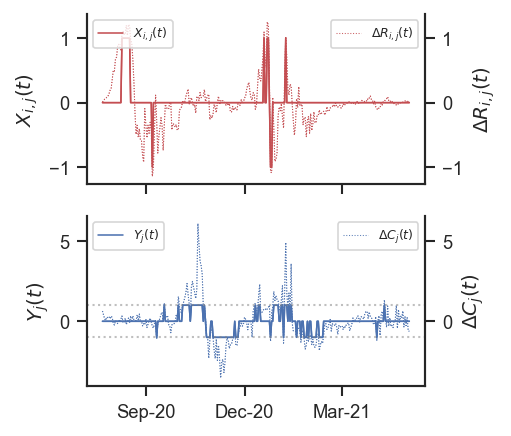

In [436]:
fig, axes = plt.subplots(2, 1, figsize=(3.5,3), sharex=True, dpi=150)

ax = axes[0]
ax.plot(dt_risk_ij_da.loc[i, j, TE_dates].to_pandas(), c='r', lw=0.5, alpha=0.9, linestyle='dotted', label=r"$\Delta R_{i,j}(t)$")
ax.plot(X_ij.loc[i, j, TE_dates].to_pandas()-1, lw=0.7, c='r')
ax.set_ylabel(r"$X_{i,j}(t)$")
ax.legend(loc=1, fontsize=6)
ax = ax.twinx()
ax.plot(dt_risk_ij_da.loc[i, j, TE_dates].to_pandas(), c='r', lw=0.5, alpha=0.9, linestyle='dotted')
ax.plot(X_ij.loc[i, j, TE_dates].to_pandas()-1, lw=0.75, c='r', label=r"$X_{i,j}(t)$")
ax.set_ylabel(r"$\Delta R_{i,j}(t)$")
ax.legend(loc=2, fontsize=6)

ax = axes[1]
ax.plot(dt_cases_by_100k_da.loc[j, TE_dates].to_pandas(), c='b', lw=0.5, alpha=0.9, linestyle='dotted', label=r"$\Delta C_{j}(t)$")
ax.plot(Y_j.loc[j, TE_dates].to_pandas()-1, lw=0.75, c='b')
ax.set_ylabel(r"$Y_j(t)$")
ax.legend(loc=1, fontsize=6)
ax = ax.twinx()
ax.plot(dt_cases_by_100k_da.loc[j, TE_dates].to_pandas(), c='b', lw=0.5, alpha=0.9, linestyle='dotted')
ax.plot(Y_j.loc[j, TE_dates].to_pandas()-1, lw=0.75, c='b', label=r"$Y_j(t)$")
ax.set_ylabel(r"$\Delta C_{j}(t)$")
ax.legend(loc=2, fontsize=6)

ax.axhline(y = 1, color = 'grey', lw=1, linestyle = 'dotted', alpha=0.5) 
ax.axhline(y = -1, color = 'grey', lw=1, linestyle = 'dotted', alpha=0.5) 

ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3)) 
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b-%y')) 

sns.despine(right=False)
fig.tight_layout()

fig_folder = "../outputs/TE_cnig_provincias/figures"
fig_name = os.path.join(fig_folder, f"X_ij_Y_i_{i_name}_{j_name}_q_{float(q):.2f}_delta_{delta}.png")
fig.savefig(fig_name)

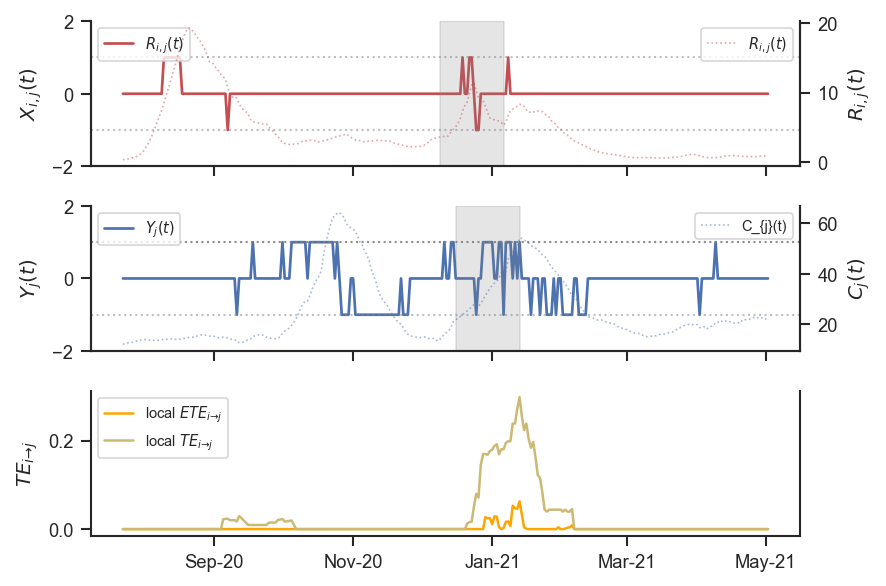

In [437]:
fig, axes = plt.subplots(3, 1, figsize=(6,4), sharex=True, dpi=150)
ax = axes[0]

ax.set_ylabel(r"$X_{i,j}(t)$")
ax.plot(X_ij.loc[i, j, TE_dates].to_pandas()-1, label=r"$R_{i,j}(t)$", lw=1.3, c='r')
ax.set_ylim([-2, 2])
ax.axhline(y = 1, color = 'grey', lw=1, linestyle = 'dotted', alpha=0.5) 
ax.axhline(y = -1, color = 'grey', lw=1, linestyle = 'dotted', alpha=0.5)
ax.legend(loc=2, ncol=2, fancybox=True, fontsize=7)
ax = ax.twinx()
ax.plot(risk_ij_da.loc[i, j, TE_dates].to_pandas(), label=r"$R_{i,j}(t)$",  c='r', lw=0.8, alpha=0.5, linestyle='dotted')
ax.set_ylabel(r"$R_{i,j}(t)$")
ax.legend(loc=0, fancybox=True, fontsize=7)
idx = 140
start = TE_dates[idx]
end = TE_dates[idx+omega+1]

start_peak = TE_dates[argmax_idx-omega-delta]
end_peak = TE_dates[argmax_idx-delta]
ax.axvspan(start_peak, end_peak, color='grey', alpha=0.2)


ax = axes[1]
ax.plot(Y_j.loc[j, TE_dates].to_pandas()-1, label=r"$Y_{j}(t)$", lw=1.3, c='b')
ax.set_ylabel(r"$Y_{j}(t)$")
ax.legend(loc=2, ncol=1, fancybox=True, fontsize=7)
ax.set_ylim([-2, 2])
ax.axhline(y = 1, color = 'grey', lw=1, linestyle = 'dotted', alpha=0.9) 
ax.axhline(y = -1, color = 'grey', lw=1, linestyle = 'dotted', alpha=0.5)
ax = ax.twinx()
ax.plot(cases_by_100k_da.loc[j, TE_dates].to_pandas(), label=r"C_{j}(t)", c='b', lw=0.8, alpha=0.5, linestyle='dotted')
ax.set_ylabel(r"$C_{j}(t)$")
ax.legend(loc=1, fancybox=True, fontsize=7)

start_peak = TE_dates[argmax_idx-omega]
end_peak = TE_dates[argmax_idx]
ax.axvspan(start_peak, end_peak, color='grey', alpha=0.2)

q = 0.95
TE_ds = load_dataset(q)
ax = axes[2]
var = "ETE_dynamic"
ax.plot(TE_ds[var].loc[i, j, TE_dates].to_pandas(), label=r"local $ETE_{i→j}$", c='orange')
var = "TE_dynamic"
ax.plot(TE_ds[var].loc[i, j, TE_dates].to_pandas(), label=r"local $TE_{i→j}$", c='y')

ax.set_ylabel(r"$TE_{i→j}$")
ax.legend(loc=2, ncol=1, fancybox=True, fontsize=7)


ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2)) 
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b-%y')) 

sns.despine(top=True, right=False)
fig.tight_layout()

In [317]:
delta = 7
omega = 28
for q in [0.1, 0.5, 0.75, 0.9, 0.95, 1, 1.05, 1.1]:
    TE_ds = load_dataset(q)
    max_te = float(TE_ds['TE_global'].max().values)
    tot_te = float(TE_ds['TE_global'].sum().values)
    mean_te = float(TE_ds['TE_global'].mean().values)
    max_ete = float(TE_ds['ETE_global'].max().values)
    tot_ete = float(TE_ds['ETE_global'].sum().values)
    mean_ete = float(TE_ds['ETE_global'].mean().values)
    print(f'q: {q:2f} - TE: tot = {tot_te:.2f}  max = {max_te:.2f} mean = {mean_te:.4f} | ETE: tot = {tot_ete:.2f} max = {max_ete:.2f} mean = {mean_ete:.4f}')


q: 0.100000 - TE: tot = 38.47  max = 0.16 mean = 0.0154 | ETE: tot = 19.07 max = 0.14 mean = 0.0076
q: 0.500000 - TE: tot = 16.65  max = 0.13 mean = 0.0067 | ETE: tot = 9.71 max = 0.11 mean = 0.0039
q: 0.750000 - TE: tot = 11.98  max = 0.11 mean = 0.0048 | ETE: tot = 6.76 max = 0.09 mean = 0.0027
q: 0.900000 - TE: tot = 10.43  max = 0.11 mean = 0.0042 | ETE: tot = 5.92 max = 0.09 mean = 0.0024
q: 0.950000 - TE: tot = 9.93  max = 0.12 mean = 0.0040 | ETE: tot = 5.64 max = 0.10 mean = 0.0023
q: 1.000000 - TE: tot = 9.41  max = 0.12 mean = 0.0038 | ETE: tot = 5.31 max = 0.10 mean = 0.0021
q: 1.050000 - TE: tot = 8.84  max = 0.14 mean = 0.0035 | ETE: tot = 4.90 max = 0.12 mean = 0.0020
q: 1.100000 - TE: tot = 8.40  max = 0.14 mean = 0.0034 | ETE: tot = 4.62 max = 0.12 mean = 0.0018


In [318]:
q = 1
delta = 7
omega = 28

for delta in range(5,22):
    experiment = f"run_ETE_w{omega}_d{delta}_S_Q1_-{q}_Q2_{q}_risk_ij"
    exp_folder = f"../outputs/TE_cnig_provincias/{experiment}/"
    results_fname = os.path.join(exp_folder, "TE.nc")
    if not os.path.exists(results_fname):
        continue
    TE_ds = xr.load_dataset(results_fname)
    max_te = float(TE_ds['TE_global'].max().values)
    tot_te = float(TE_ds['TE_global'].sum().values)
    mean_te = float(TE_ds['TE_global'].mean().values)
    
    max_ete = float(TE_ds['ETE_global'].max().values)
    tot_ete = float(TE_ds['ETE_global'].sum().values)
    mean_ete = float(TE_ds['ETE_global'].mean().values)
    
    print(f'Delta: {delta:2d} q:{q} - TE: tot = {tot_te:.2f}  max = {max_te:.2f} mean = {mean_te:.4f} | ETE: tot = {tot_ete:.2f} max = {max_ete:.2f} mean = {mean_ete:.4f}')


Delta:  5 q:1 - TE: tot = 9.39  max = 0.12 mean = 0.0038 | ETE: tot = 5.30 max = 0.10 mean = 0.0021
Delta:  6 q:1 - TE: tot = 9.39  max = 0.11 mean = 0.0038 | ETE: tot = 5.29 max = 0.09 mean = 0.0021
Delta:  7 q:1 - TE: tot = 9.41  max = 0.12 mean = 0.0038 | ETE: tot = 5.31 max = 0.10 mean = 0.0021
Delta:  8 q:1 - TE: tot = 9.28  max = 0.12 mean = 0.0037 | ETE: tot = 5.16 max = 0.10 mean = 0.0021
Delta:  9 q:1 - TE: tot = 8.99  max = 0.11 mean = 0.0036 | ETE: tot = 4.86 max = 0.09 mean = 0.0019
Delta: 10 q:1 - TE: tot = 8.87  max = 0.13 mean = 0.0035 | ETE: tot = 4.73 max = 0.11 mean = 0.0019
Delta: 11 q:1 - TE: tot = 9.12  max = 0.12 mean = 0.0036 | ETE: tot = 4.98 max = 0.10 mean = 0.0020
Delta: 12 q:1 - TE: tot = 9.05  max = 0.14 mean = 0.0036 | ETE: tot = 4.89 max = 0.11 mean = 0.0020
Delta: 13 q:1 - TE: tot = 8.89  max = 0.10 mean = 0.0036 | ETE: tot = 4.72 max = 0.08 mean = 0.0019
Delta: 14 q:1 - TE: tot = 8.71  max = 0.11 mean = 0.0035 | ETE: tot = 4.51 max = 0.09 mean = 0.0018


In [152]:
from matplotlib.colors import LinearSegmentedColormap

# Define a colormap that transitions from white to red
white_red_cmap = LinearSegmentedColormap.from_list("white_red", ["white", "red"])

../outputs/TE_cnig_provincias/figures/TE_q_0.10_delta_7_heatmap.png
../outputs/TE_cnig_provincias/figures/DI_q_0.10_delta_7_heatmap.png
../outputs/TE_cnig_provincias/figures/TE_q_0.50_delta_7_heatmap.png
../outputs/TE_cnig_provincias/figures/DI_q_0.50_delta_7_heatmap.png
../outputs/TE_cnig_provincias/figures/TE_q_0.75_delta_7_heatmap.png
../outputs/TE_cnig_provincias/figures/DI_q_0.75_delta_7_heatmap.png
../outputs/TE_cnig_provincias/figures/TE_q_0.90_delta_7_heatmap.png
../outputs/TE_cnig_provincias/figures/DI_q_0.90_delta_7_heatmap.png
../outputs/TE_cnig_provincias/figures/TE_q_0.95_delta_7_heatmap.png
../outputs/TE_cnig_provincias/figures/DI_q_0.95_delta_7_heatmap.png
../outputs/TE_cnig_provincias/figures/TE_q_1.00_delta_7_heatmap.png
../outputs/TE_cnig_provincias/figures/DI_q_1.00_delta_7_heatmap.png
../outputs/TE_cnig_provincias/figures/TE_q_1.05_delta_7_heatmap.png
../outputs/TE_cnig_provincias/figures/DI_q_1.05_delta_7_heatmap.png
../outputs/TE_cnig_provincias/figures/TE_q_1.10_

/tmp/ipykernel_53430/1044186184.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 1, figsize=(18,12), sharex=True, dpi=200)


../outputs/TE_cnig_provincias/figures/EDI_q_0.75_delta_7_heatmap.png
../outputs/TE_cnig_provincias/figures/ETE_q_0.90_delta_7_heatmap.png
../outputs/TE_cnig_provincias/figures/EDI_q_0.90_delta_7_heatmap.png
../outputs/TE_cnig_provincias/figures/ETE_q_0.95_delta_7_heatmap.png
../outputs/TE_cnig_provincias/figures/EDI_q_0.95_delta_7_heatmap.png
../outputs/TE_cnig_provincias/figures/ETE_q_1.00_delta_7_heatmap.png
../outputs/TE_cnig_provincias/figures/EDI_q_1.00_delta_7_heatmap.png
../outputs/TE_cnig_provincias/figures/ETE_q_1.05_delta_7_heatmap.png
../outputs/TE_cnig_provincias/figures/EDI_q_1.05_delta_7_heatmap.png
../outputs/TE_cnig_provincias/figures/ETE_q_1.10_delta_7_heatmap.png
../outputs/TE_cnig_provincias/figures/EDI_q_1.10_delta_7_heatmap.png


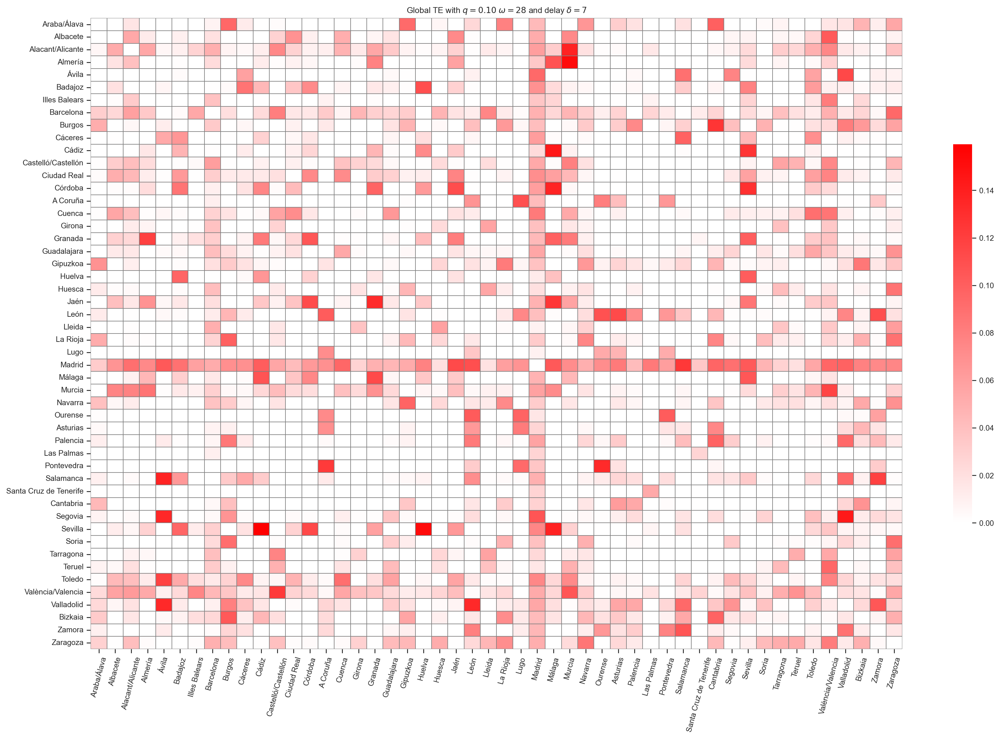

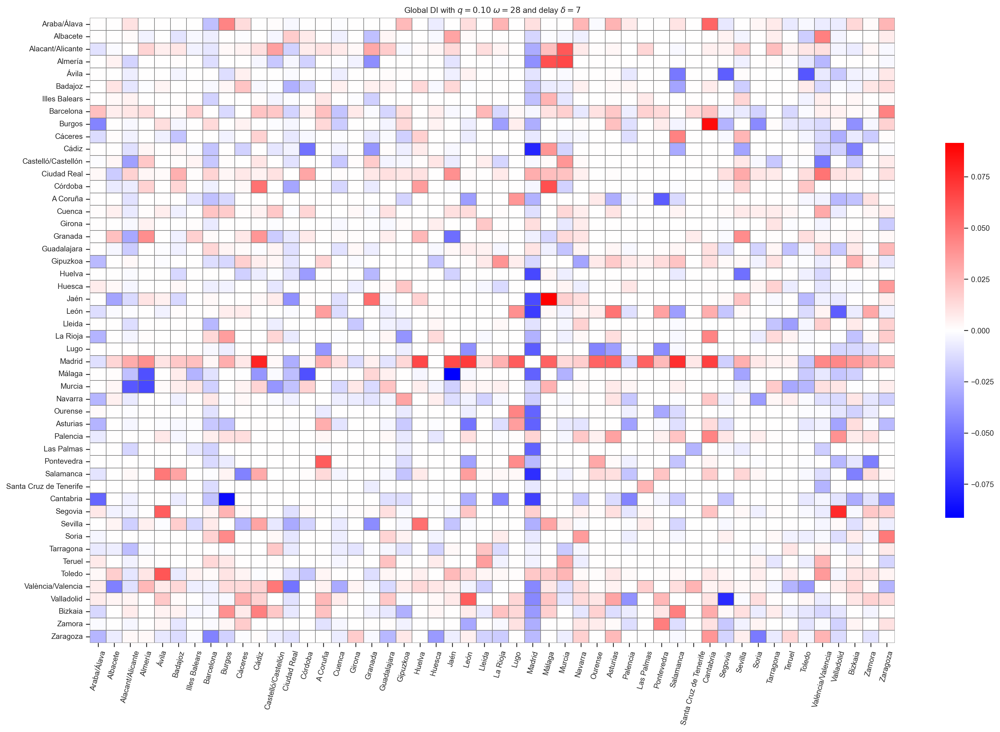

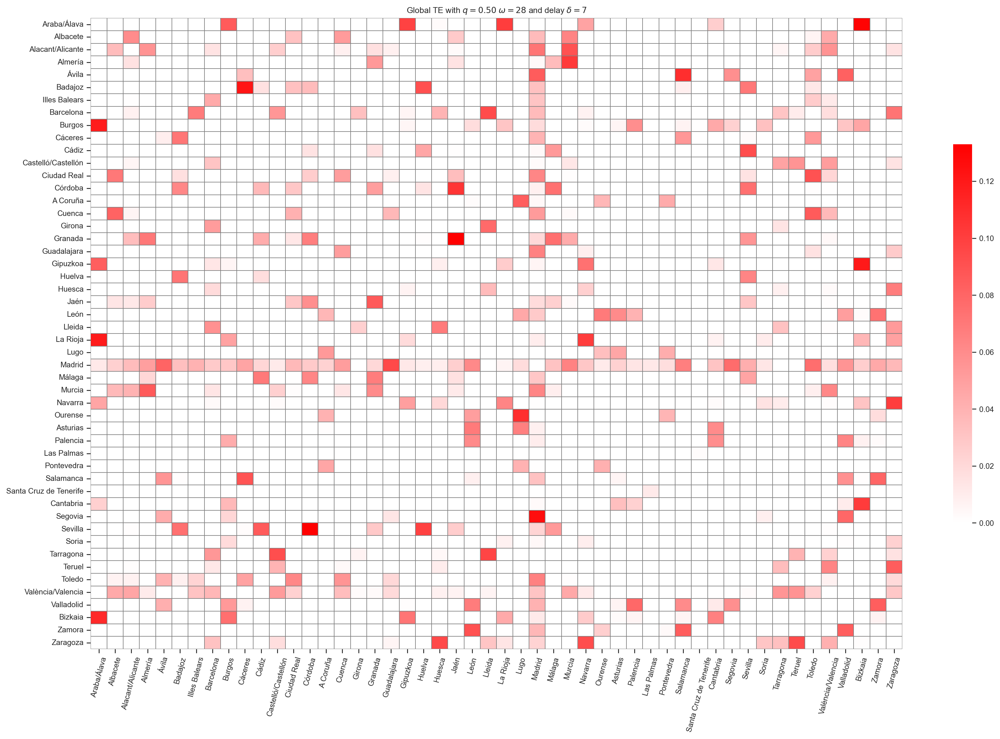

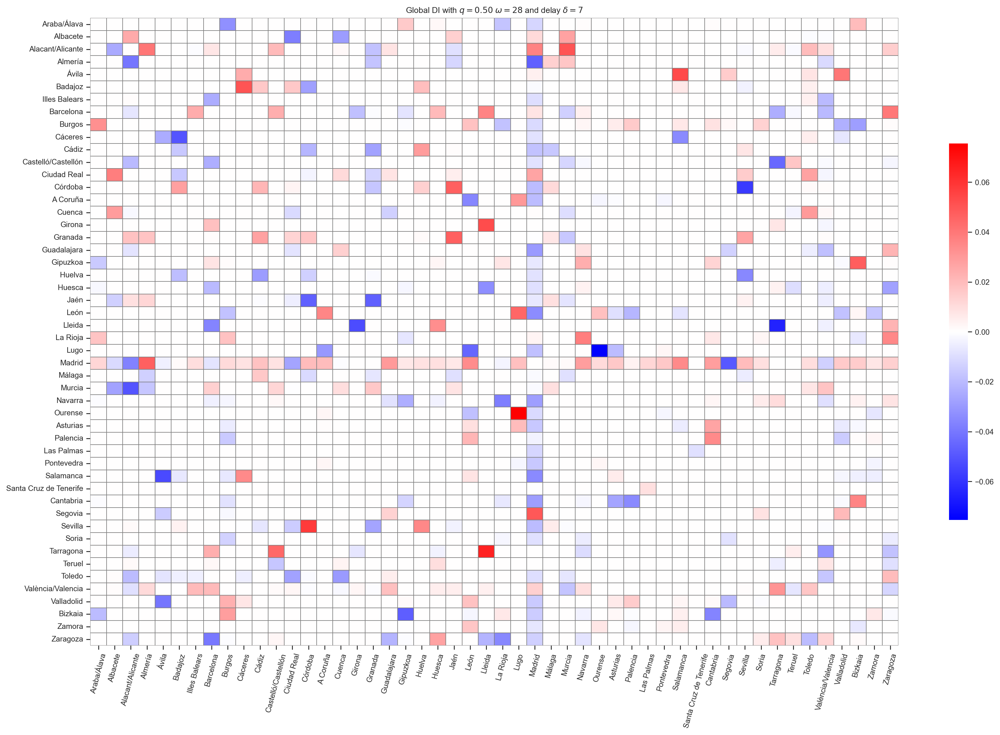

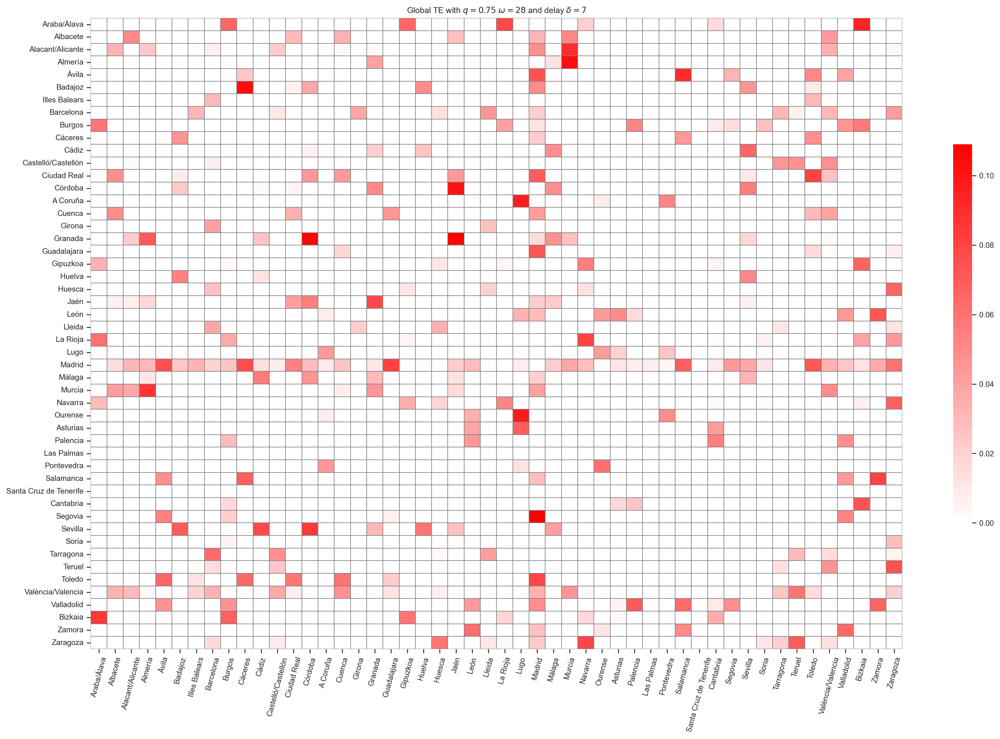

...

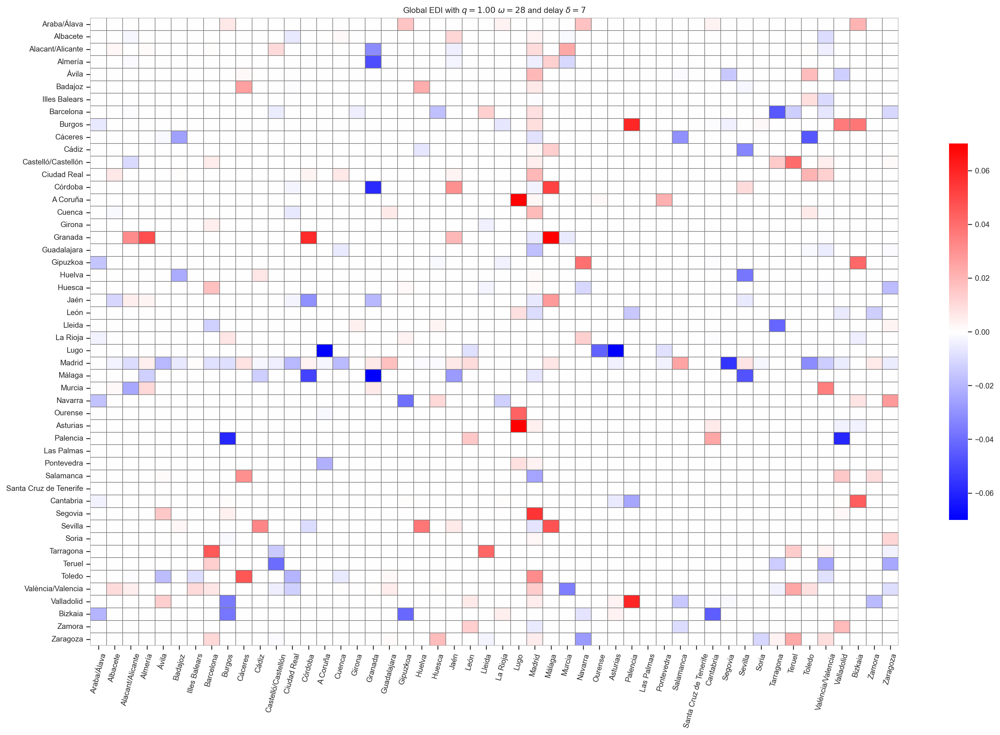

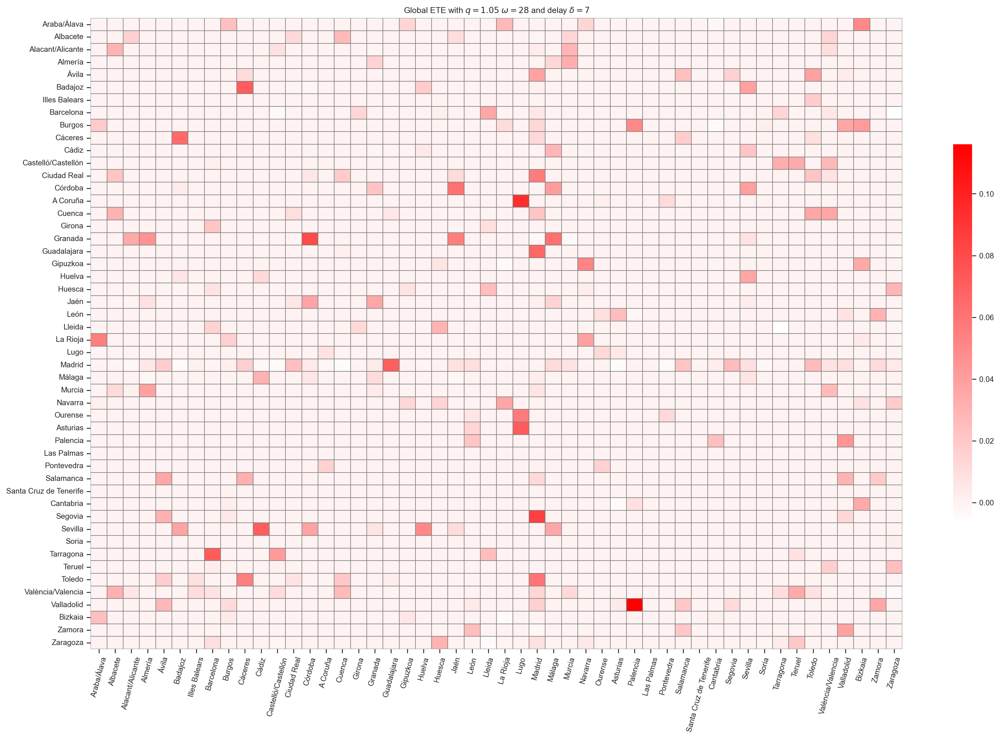

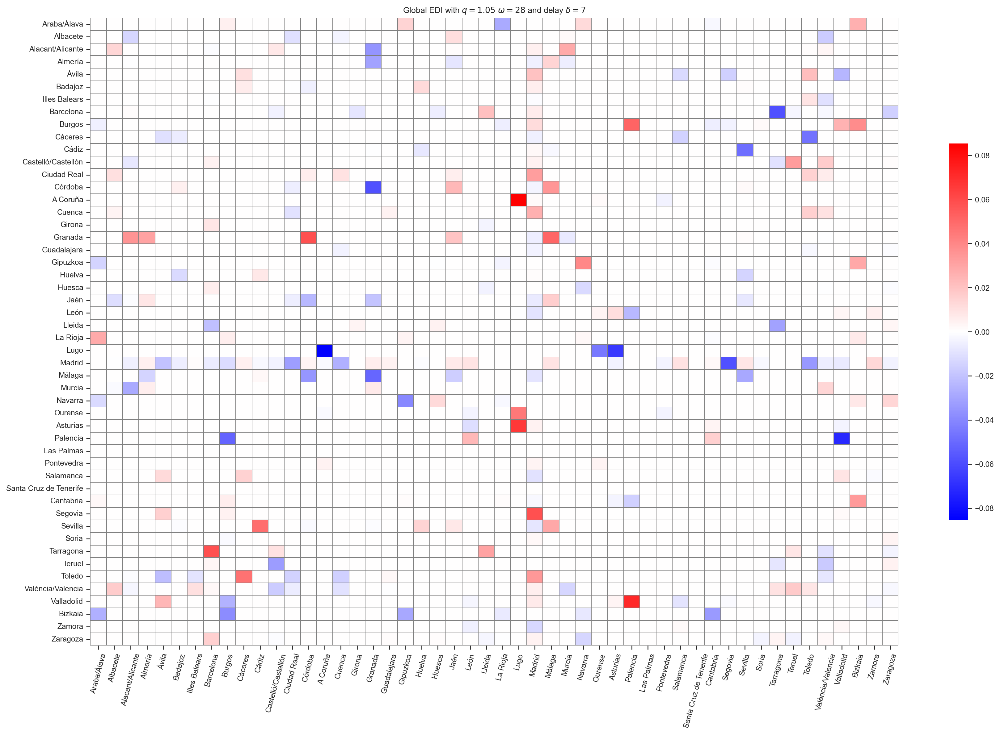

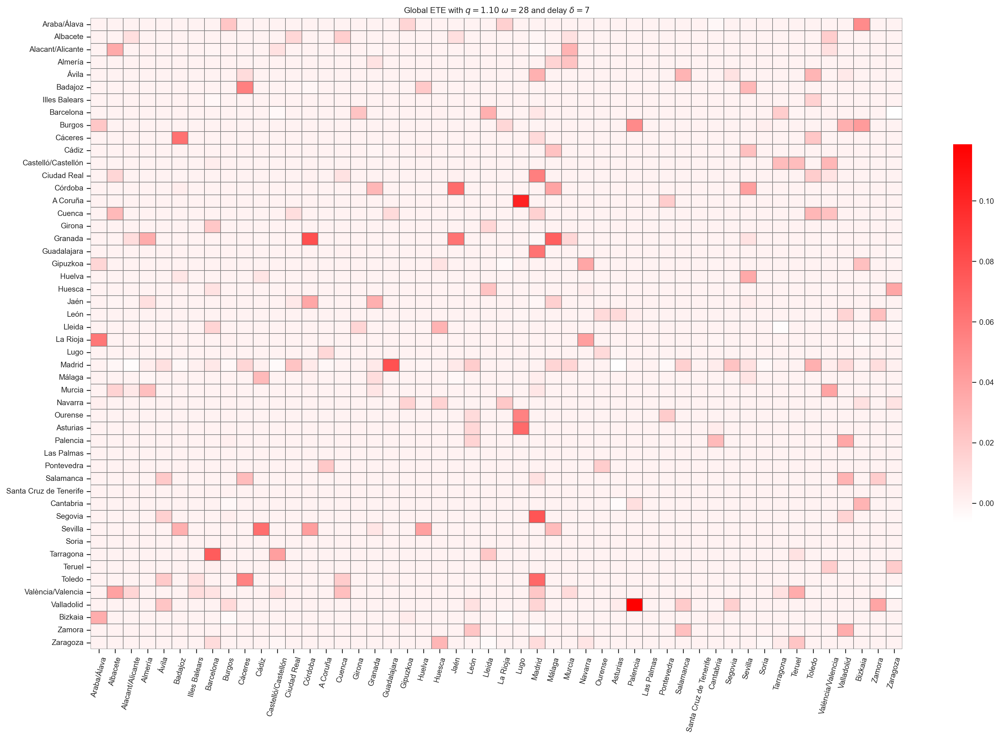

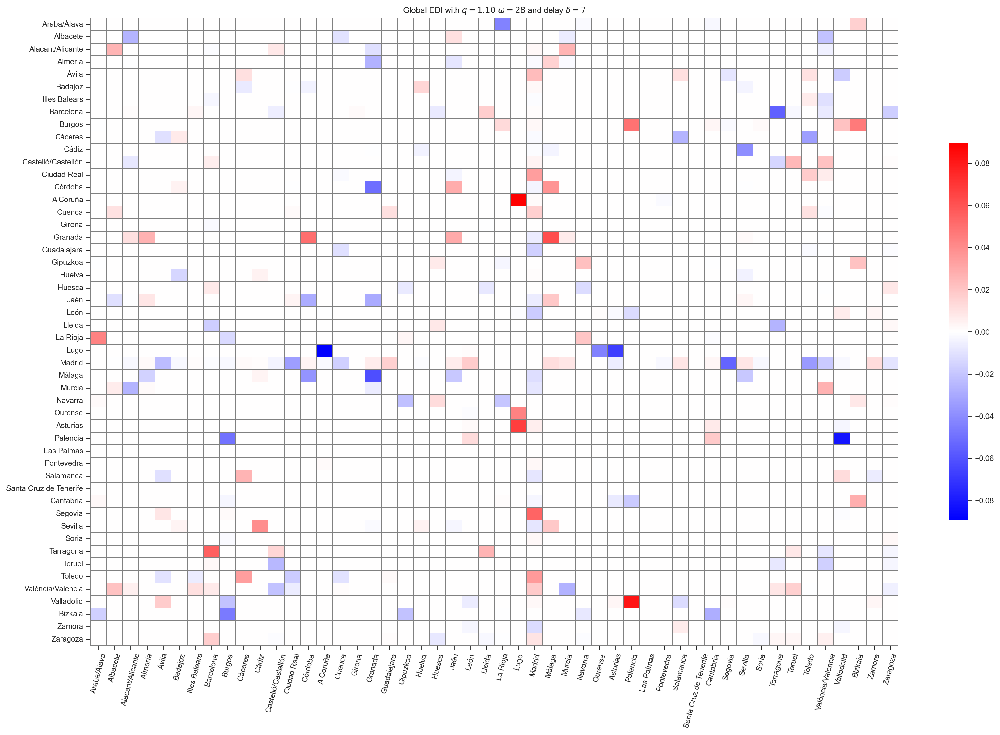

In [154]:
delta = 7
omega = 28
fig_folder = "../outputs/TE_cnig_provincias/figures"

for var in ["TE", "ETE"]:
    for q in [0.1, 0.5, 0.75, 0.9, 0.95, 1, 1.05, 1.1]:
        TE_ds = load_dataset(q)
        data = TE_ds[var+"_global"].values
        TE_global =  pd.DataFrame(data=data, columns=pro_names, index=pro_names)
        DI_global = pd.DataFrame(data=(data-data.T), columns=pro_names, index=pro_names)
        
        fig_name = os.path.join(fig_folder, f"{var}_q_{float(q):.2f}_delta_{delta}_heatmap.png")
        print(fig_name)
        fig = heatmap_global_TE(TE_global, cmap=white_red_cmap, title=rf'Global {var} with $q={q:.2f}$ $\omega={omega}$ and delay $\delta={delta}$')
        fig.savefig(fig_name)
        
        label = "DI"
        if var == "ETE":
            label = "EDI"
        
        fig_name = os.path.join(fig_folder, f"{label}_q_{float(q):.2f}_delta_{delta}_heatmap.png")
        print(fig_name)
        fig = heatmap_global_TE(DI_global, cmap='bwr', title=rf'Global {label} with $q={q:.2f}$ $\omega={omega}$ and delay $\delta={delta}$')
        fig.savefig(fig_name)

R=0.62   p-value=2.13e-38


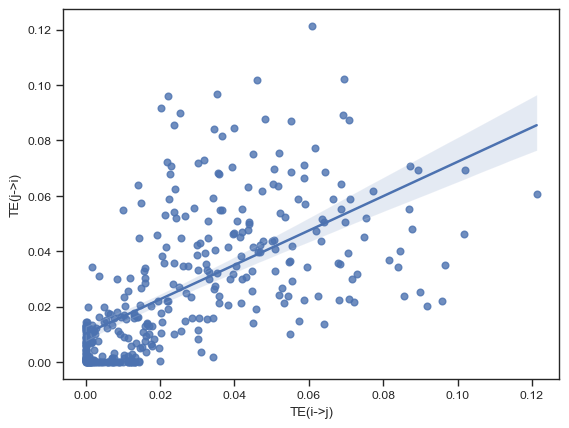

In [445]:
thr = 1e-5
q = 1
var="TE_global"
TE_ds = load_dataset(q)
TE_global = TE_ds[var]

data = []
for i in df_pro.index:
    for j in df_pro.index:
        if i==j:
            continue
        ij = float(TE_global.loc[i,j])
        ji = float(TE_global.loc[j,i])
        if ij < thr and ji < thr :
            continue
        data.append([ij, ji])

from scipy.stats import pearsonr

df = pd.DataFrame(data, columns=["TE(i->j)", "TE(j->i)"])
sns.regplot(data=df, x="TE(i->j)", y="TE(j->i)")


# call the scipy function for pearson correlation
r, p = pearsonr(df["TE(i->j)"], df["TE(j->i)"])
print(f"R={r:.2f}   p-value={p:.2e}")
# annotate the pearson correlation coefficient text to 2 decimal places
# plt.text(.05, .8, 'r={:.2f}'.format(r), transform=ax.transAxes)

In [282]:
import matplotlib as mpl

from shapely.geometry.polygon import Polygon
from shapely.geometry.multipolygon import MultiPolygon
from shapely.affinity import affine_transform
from matplotlib.patches import Rectangle



gdf = gpd.read_file('../data/cnig_provincias.geojson').set_index('id')
gdf = gdf.drop(['51', '52']).sort_index()

for i in gdf.index:
    gdf.loc[i, 'centroid'] = gdf.loc[i, 'geometry'].centroid

xoff = 5;  yoff = 7
matrix = [1, 0, 0, 1, xoff, yoff]
canary_islands = ["38", "35"]
for i in canary_islands:
    geom = gdf.loc[i, 'geometry']
    gdf.at[i, 'geometry'] = affine_transform(geom, matrix)
    centroid = gdf.loc[i, 'centroid']
    gdf.at[i, 'centroid'] = affine_transform(centroid, matrix)



<AxesSubplot: >

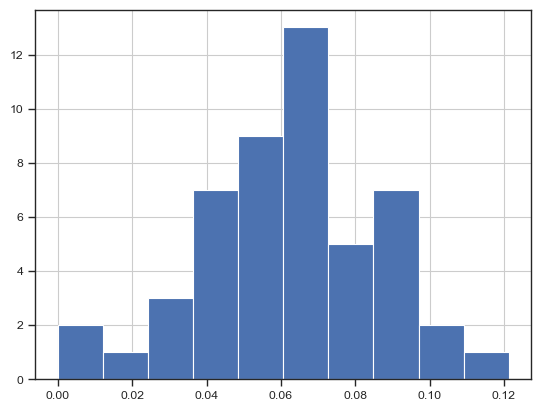

In [447]:
TE_global.max('target').to_pandas().hist()

0.019686492584974943


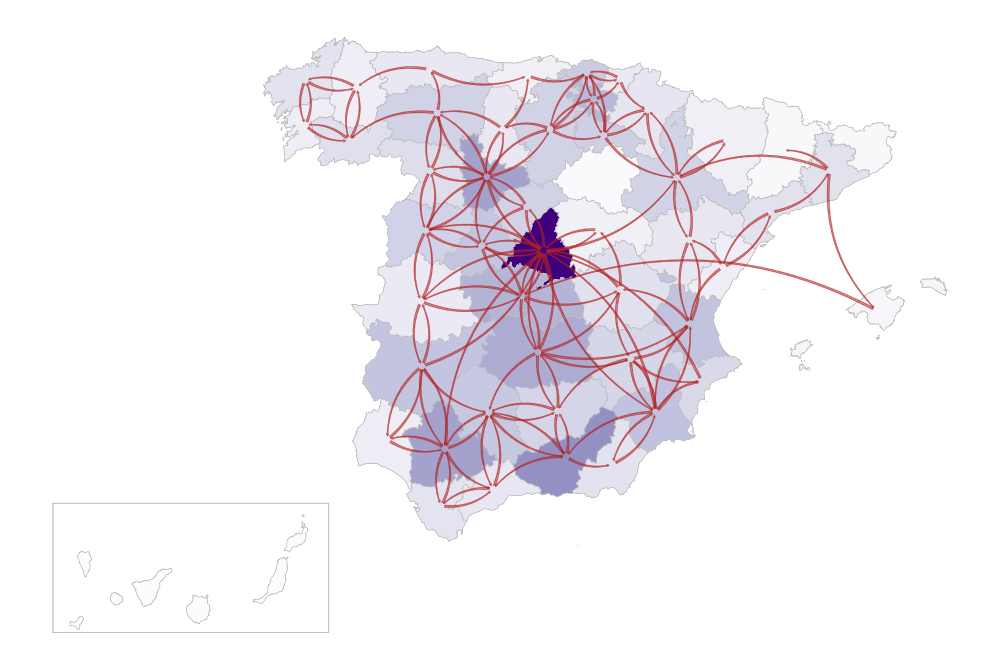

In [457]:
q = 0.75
var = "ETE_global"
TE_ds = load_dataset(q)
TE_global = TE_ds[var]

df_global_TE = TE_global.to_dataframe()
thr_quantile = 0.1
thr = np.quantile(TE_global.max('target').values, thr_quantile)
print(thr)

fig, ax = plt.subplots(1, 1, figsize=(16,16), dpi=200)
ax.add_patch(Rectangle((-13.5,34.6), 5.5, 2., edgecolor='silver', facecolor='none', lw=1))

gdf_aux = pd.merge(gdf, TE_global.sum('target').to_dataframe(), left_index=True, right_index=True)

cmap = sns.color_palette("Purples", as_cmap=True)
norm = mpl.colors.Normalize(vmin=0, vmax=gdf_aux[var].max())

gdf_aux.plot(edgecolor='silver', linewidth=0.8, column=var, cmap=cmap, ax=ax, norm=norm)

ax.set_axis_off()
ax.set_facecolor('white')

df_global_TE = df_global_TE[df_global_TE[var] > thr]

G = nx.DiGraph()
G.add_weighted_edges_from(df_global_TE.reset_index().values)

coord_dict = {k:(v.x, v.y) for k,v in gdf['centroid'].to_dict().items()}
nodes = nx.draw_networkx_nodes(G, coord_dict, node_size=0, node_color="white", ax=ax)
edges = nx.draw_networkx_edges(G, coord_dict, arrowstyle='fancy', connectionstyle="arc3,rad=0.24", 
                           arrowsize=5, node_size=40, edge_color="firebrick", alpha=0.5, ax=ax)
nodes.set_edgecolor('grey')

In [451]:
TE_global.max('target').to_pandas()

source
01    0.049433
02    0.028662
03    0.029763
04    0.032570
05    0.036011
06    0.080542
07    0.017439
08    0.033689
09    0.063068
10    0.054642
11    0.046084
12    0.052977
13    0.054030
14    0.065770
15    0.076292
16    0.029176
17    0.020907
18    0.077211
19    0.048648
20    0.051564
21    0.029736
22    0.023621
23    0.048151
24    0.033324
25    0.024053
26    0.043601
27    0.023572
28    0.065982
29    0.032506
30    0.046674
31    0.033202
32    0.066325
33    0.072961
34    0.040043
35    0.000000
36    0.014013
37    0.046929
38    0.000000
39    0.043737
40    0.080128
41    0.067130
42    0.007944
43    0.060728
44    0.013728
45    0.054696
46    0.036817
47    0.099414
48    0.028871
49    0.057379
50    0.042226
dtype: float64

In [67]:
sns.set_theme('paper')
sns.set_style("ticks")


q = 1
delta = 7
omega = 28
experiment = f"run_ETE_w{omega}_d{delta}_S_Q1_-{q}_Q2_{q}_risk_ij"
exp_folder = f"../outputs/TE_cnig_provincias/{experiment}/"

results_fname = os.path.join(exp_folder, "TE.nc")
TE_ds = xr.load_dataset(results_fname)
TE  = TE_ds['TE_dynamic']
ETE = TE_ds['ETE_dynamic']

X_fname = os.path.join(exp_folder, "X.nc")
X_ij = xr.load_dataarray(X_fname)

Y_fname = os.path.join(exp_folder, "Y.nc")
Y_j = xr.load_dataarray(Y_fname)



thr = 0.9
use_ETE = False
top = 2
offset = 45


study_cases = [("28", "33"), ("28", "19"), ("07", "08"), ("25", "22"), ("03", "30")]
study_cases = study_cases + [(y,x) for x,y in study_cases]
study_cases = sorted(study_cases)

for x,y in study_cases:    
    TE_xy = TE.loc[x,y,:]
    TE_yx = TE.loc[y,x,:]

    ETE_xy = ETE.loc[x,y,:]
    ETE_yx = ETE.loc[y,x,:]
    
    start = omega
    TE_dates = dates[start:]
    end = min(len(TE_dates), TE_xy.shape[0])
    TE_dates = TE_dates[:end]
    
    DIxy = TE_xy - TE_yx
    DIxy[np.abs(DIxy) < thr] = 0
    
    EDIxy = ETE_xy - ETE_yx
    EDIxy[np.abs(EDIxy) < thr] = 0

    print(len(TE_dates), len(DIxy))

    if DIxy[offset:].max() < thr:
        continue

    top_k_TE_indices = np.argsort(DIxy[offset:])[-top:][::-1] + offset -1
    top_k_TE_dates = TE_dates[top_k_TE_indices]
    
    top_k_ETE_indices = np.argsort(EDIxy[offset:])[-top:][::-1] + offset 
    top_k_ETE_dates = TE_dates[top_k_ETE_indices]
    
    top_k_indices = top_k_TE_indices
    top_k_dates = top_k_TE_dates
    if use_ETE:
        top_k_indices = top_k_ETE_indices
        top_k_dates = top_k_ETE_dates
    
    
    if np.abs(top_k_indices[0] - top_k_indices[1]) < omega/2.:
        top_k_indices = top_k_indices[:1]
        top_k_dates = top_k_dates[:1]
    
    fig, axes = plt.subplots(3, 1, figsize=(10,4), sharex=True, dpi=150)
    ax = axes[0]
    ax.plot(risk_ij.loc[x, y, TE_dates].to_pandas(), label=rf"R[{x} -> {y}](t)")
    ax.plot(risk_ij.loc[y, x, TE_dates].to_pandas(), label=rf"R[{y} -> {x}](t)", c='r', alpha=0.3)
    ax.legend(loc=2)
    ax = ax.twinx()
    ax.set_yticks([-1,0,1])
    ax.plot(X_ij.loc[x, y, TE_dates].to_pandas()-1, c='grey', alpha=0.5)
    for index_date in top_k_indices:
        start = TE_dates[index_date-omega-delta]
        end = TE_dates[index_date-delta]
        ax.axvspan(start, end, color='grey', alpha=0.3)
    
    ax = axes[1]
    ax.plot(cases_by_100k.loc[x, TE_dates].to_pandas(), label=rf"C[{x}](t)", alpha=0.3)
    ax.plot(cases_by_100k.loc[y, TE_dates].to_pandas(), c='r', label=rf"C[{y}](t)")
    ax.legend(loc=2)
    ax = ax.twinx()
    ax.set_yticks([-1,0,1])
    ax.plot(Y_j.loc[y, TE_dates].to_pandas()-1, c='grey', alpha=0.5)
    for index_date in top_k_indices:
        start = TE_dates[index_date-omega]
        end = TE_dates[index_date]
        ax.axvspan(start, end, color='grey', alpha=0.3)
    
    axes[2].plot(TE_dates, DIxy, label=r"$DI_{xy}$")
    axes[2].plot(TE_dates, EDIxy, label=r"$DI^{eff}_{xy}$")
    axes[2].set_yticks([-0.6,0,0.6])
    for index_date in top_k_indices:
        axes[2].axvline(TE_dates[index_date], c='k', ls='--', lw=2, alpha=0.5)
    axes[2].legend(loc=2)
   
    sns.despine(left=False, right=False)
    plt.show()

414 414
414 414
414 414
414 414
414 414
414 414
414 414
414 414
414 414
414 414


414 414


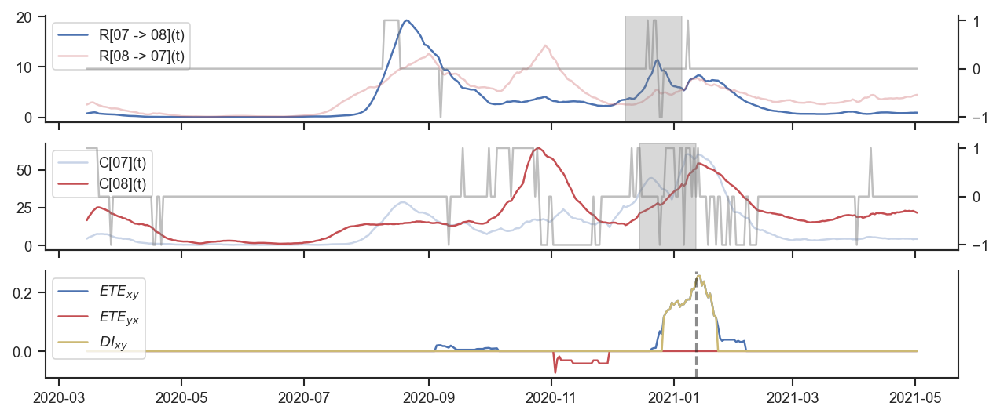

414 414
414 414


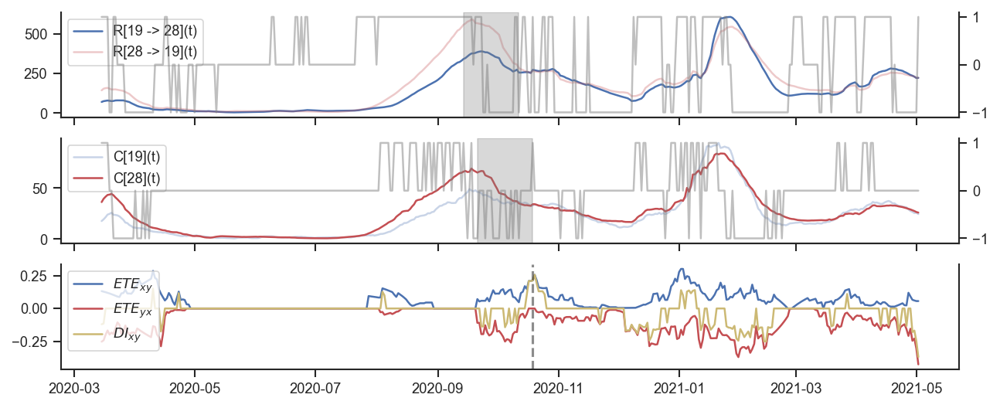

414 414


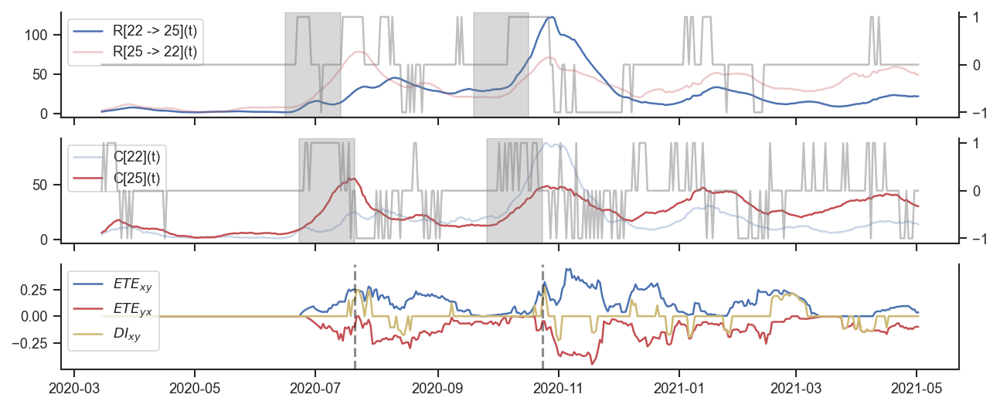

414 414


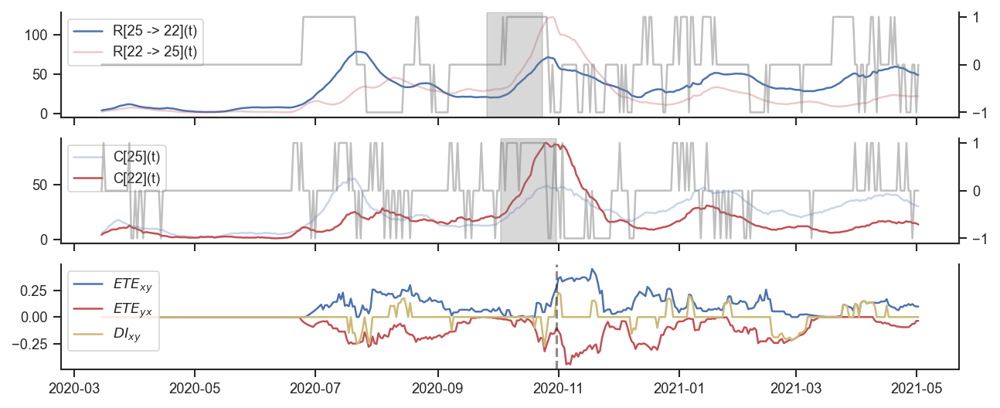

414 414


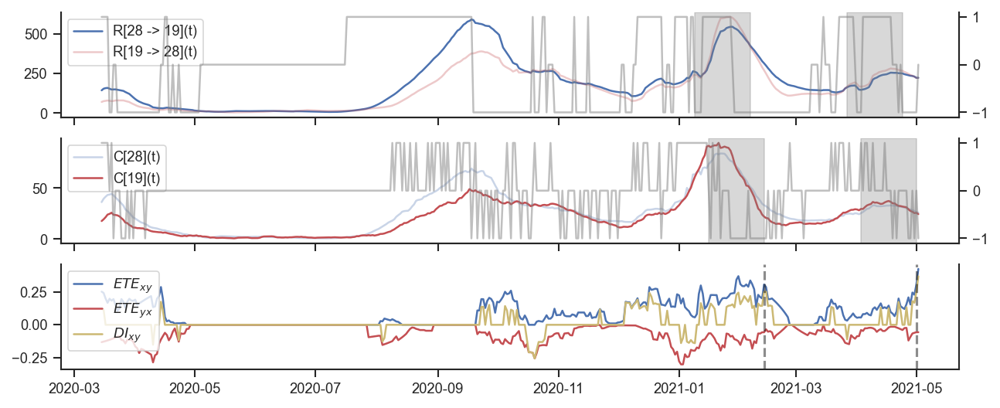

414 414


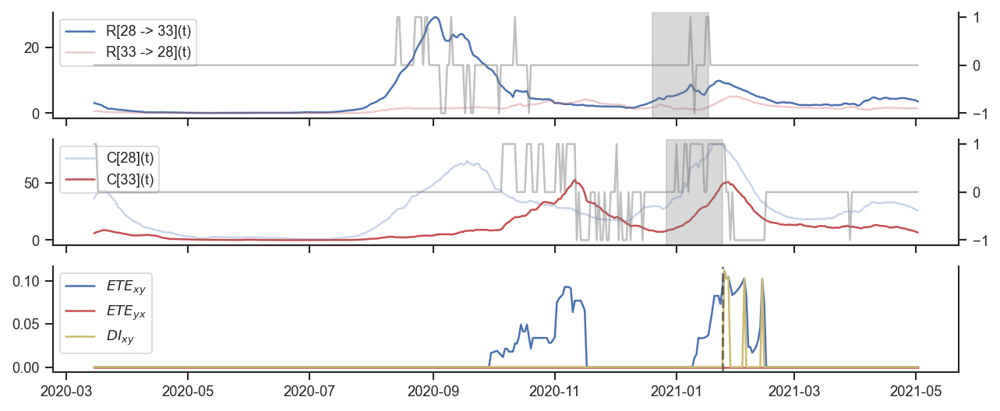

414 414


In [71]:
sns.set_theme('paper')
sns.set_style("ticks")


q = 1
delta = 7
omega = 28
experiment = f"run_ETE_w{omega}_d{delta}_S_Q1_-{q}_Q2_{q}_risk_ij"
exp_folder = f"../outputs/TE_cnig_provincias/{experiment}/"

results_fname = os.path.join(exp_folder, "TE.nc")
TE_ds = xr.load_dataset(results_fname)
TE  = TE_ds['TE_dynamic']
ETE = TE_ds['ETE_dynamic']

X_fname = os.path.join(exp_folder, "X.nc")
X_ij = xr.load_dataarray(X_fname)

Y_fname = os.path.join(exp_folder, "Y.nc")
Y_j = xr.load_dataarray(Y_fname)


thr = 0.1
use_ETE = False
top = 2
offset = 45


study_cases = [("28", "33"), ("28", "19"), ("07", "08"), ("25", "22")]
study_cases = study_cases + [(y,x) for x,y in study_cases]
study_cases = sorted(study_cases)

for x,y in study_cases:    
    TE_xy = TE.loc[x,y,:]
    TE_yx = TE.loc[y,x,:]

    ETE_xy = ETE.loc[x,y,:]
    ETE_yx = ETE.loc[y,x,:]
    
    start = omega
    TE_dates = dates[start:]
    end = min(len(TE_dates), TE_xy.shape[0])
    TE_dates = TE_dates[:end]
    
    DIxy = TE_xy - TE_yx
    DIxy[np.abs(DIxy) < thr] = 0
    
    EDIxy = ETE_xy - ETE_yx
    EDIxy[np.abs(EDIxy) < thr] = 0

    print(len(TE_dates), len(DIxy))

    if DIxy[offset:].max() < thr:
        continue

    top_k_TE_indices = np.argsort(DIxy[offset:])[-top:][::-1] + offset -1
    top_k_TE_dates = TE_dates[top_k_TE_indices]
    
    top_k_ETE_indices = np.argsort(EDIxy[offset:])[-top:][::-1] + offset -1
    top_k_ETE_dates = TE_dates[top_k_ETE_indices]
    
    top_k_indices = top_k_TE_indices
    top_k_dates = top_k_TE_dates
    
    if np.abs(top_k_indices[0] - top_k_indices[1]) < omega/2.:
        top_k_indices = top_k_indices[:1]
        top_k_dates = top_k_dates[:1]
    
    fig, axes = plt.subplots(3, 1, figsize=(10,4), sharex=True, dpi=150)
    ax = axes[0]
    ax.plot(risk_ij.loc[x, y, TE_dates].to_pandas(), label=rf"R[{x} -> {y}](t)")
    ax.plot(risk_ij.loc[y, x, TE_dates].to_pandas(), label=rf"R[{y} -> {x}](t)", c='r', alpha=0.3)
    ax.legend(loc=2)
    ax = ax.twinx()
    ax.set_yticks([-1,0,1])
    ax.plot(X_ij.loc[x, y, TE_dates].to_pandas()-1, c='grey', alpha=0.5)
    for index_date in top_k_indices:
        start = TE_dates[index_date-omega-delta]
        end = TE_dates[index_date-delta]
        ax.axvspan(start, end, color='grey', alpha=0.3)
    
    ax = axes[1]
    ax.plot(cases_by_100k.loc[x, TE_dates].to_pandas(), label=rf"C[{x}](t)", alpha=0.3)
    ax.plot(cases_by_100k.loc[y, TE_dates].to_pandas(), c='r', label=rf"C[{y}](t)")
    ax.legend(loc=2)
    ax = ax.twinx()
    ax.set_yticks([-1,0,1])
    ax.plot(Y_j.loc[y, TE_dates].to_pandas()-1, c='grey', alpha=0.5)
    for index_date in top_k_indices:
        start = TE_dates[index_date-omega]
        end = TE_dates[index_date]
        ax.axvspan(start, end, color='grey', alpha=0.3)
    
    axes[2].plot(TE_dates, TE_xy, label=r"$ETE_{xy}$")
    axes[2].plot(TE_dates, -1*TE_yx, label=r"$ETE_{yx}$", c='r')
    
    axes[2].plot(TE_dates, DIxy, label=r"$DI_{xy}$", c='y')
    #axes[2].plot(TE_dates, EDIxy, label=r"$DI^{eff}_{xy}$", c='y')
    #axes[2].set_yticks([-0.6,0,0.6])

    for index_date in top_k_indices:
        axes[2].axvline(TE_dates[index_date], c='k', ls='--', lw=1.5, alpha=0.5)
    axes[2].legend(loc=2)
   
    sns.despine(left=False, right=False)
    plt.show()